In [1]:
import pickle
import os
import pandas as pd
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point, LineString
import random 
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.metrics import silhouette_score, r2_score, mean_squared_error
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from scipy.stats import ttest_ind
import hdbscan
from itertools import combinations
import umap
import seaborn as sns


from tqdm import tqdm

from functions import *

In [2]:
data_dir = os.path.join("../../data/embeddings/")
lsoas_file = os.path.join("../../data/SpatialData/", "LSOAs_2021", "LSOA_2021_EW_BSC_V4.shp")

### IMD data

In [3]:
imd_file = os.path.join("../../", "data", "imd", "File_2_-_IoD2025_Domains_of_Deprivation.xlsx")
imd = pd.read_excel(imd_file, sheet_name="IoD2025 Domains", header=0)

# Rename columns to simpler versions
imd_col_map = {"LSOA code (2021)": "LSOA21CD",
    "Index of Multiple Deprivation (IMD) Rank (where 1 is most deprived)": "imd_rank",
    "Index of Multiple Deprivation (IMD) Decile (where 1 is most deprived 10% of LSOAs)": "imd_decile"}
imd = imd.rename(columns=imd_col_map)

## Spatial data
### Get LSOAs spatial data, keep just those in Greater Manchester

In [4]:
lsoas =  gpd.read_file(lsoas_file)
manc_lads = ['Manchester', 'Rochdale', 'Bolton', 'Bury', 'Wigan', 'Oldham',  'Trafford', 'Salford', 'Tameside', 'Stockport']
manc_lads_pattern = '|'.join(manc_lads)
gm_lsoa=lsoas[lsoas['LSOA21NM'].str.contains(manc_lads_pattern)].copy()

In [5]:
# Define Manchester city centre point (in WGS84, then project)
city_centre_wgs84 = Point(-2.2426, 53.4808)  # approx lat/lon of Manchester city centre
city_centre_point = gpd.GeoSeries([city_centre_wgs84], crs='EPSG:4326').to_crs(epsg=27700).iloc[0]

# Filter polygons within a buffer distance (e.g., 3 km radius)
buffer = city_centre_point.buffer(6000)  # 3000 meters
central_lsoas = gm_lsoa[gm_lsoa.intersects(buffer)]
central_lsoas.reset_index(inplace=True)
central_lsoas= central_lsoas.to_crs(epsg=4326)

### Find distance between centre of each LSOA and the middle of Manchester

In [6]:
# Reference point (Manchester city centre) in WGS84
ref_point = gpd.GeoSeries([Point(-2.2425, 53.480833)], crs="EPSG:4326")

# Project the reference point too
ref_point_metric = ref_point.to_crs(epsg=27700).iloc[0]

# Calculate distance from centroid of each LSOA to reference point
gm_lsoa["distance_to_centre_m"] = gm_lsoa.geometry.centroid.distance(ref_point_metric)

gm_lsoa = gm_lsoa.to_crs(epsg=4326)

## Embeddings 
### Get embeddings (four per location)

In [7]:
points_data_cache = data_dir + "sample_points_cache/points_data_cache_with_embeddings_and_attn_stats_new.pkl"
with open(points_data_cache, "rb") as f:
    point_records = pickle.load(f)

### Join image embeddings points to gentrification LSOAs

In [8]:
point_coords = [Point(rec['longitude'], rec['latitude']) for rec in point_records]
points_labels_gdf = gpd.GeoDataFrame(point_records, geometry=point_coords, crs="EPSG:4326")

# Perform spatial join to get gentrification label for each point
points_labels_gdf = gpd.sjoin(points_labels_gdf, gm_lsoa, how='inner', predicate='within')
# sjoin may add an index from the polygon ('index_right'); we can drop it
if 'index_right' in points_labels_gdf.columns:
    points_labels_gdf = points_labels_gdf.drop(columns=['index_right'])

print(f"Points after spatial join: {len(points_labels_gdf)} / {len(point_records)}"
      f" `(some points may lie outside the label polygons and were dropped)")

Points after spatial join: 18897 / 18897 `(some points may lie outside the label polygons and were dropped)


### Expand so there is one row per each image

In [9]:
expanded_rows = []

for _, row in points_labels_gdf.iterrows():
    embeddings = row['embeddings']      # list of 4 embeddings
    images = row['image_files']        # list of 4 image paths

    # Skip if lengths don't match
    if len(embeddings) != len(images):
        print(f"Skipping row {row.name}: {len(embeddings)} embeddings, {len(images)} images")
        continue

    for emb, img in zip(embeddings, images):
        new_row = row.to_dict()        # copy all other columns
        new_row['embeddings'] = emb     # single embedding
        new_row['image_files'] = img    # single image
        expanded_rows.append(new_row)

# Create new DataFrame
expanded_gdf = pd.DataFrame(expanded_rows)
print(f"Original rows: {len(points_labels_gdf)}, Expanded rows: {len(expanded_gdf)}")
expanded_gdf = pd.DataFrame(expanded_rows)


Skipping row 9158: 3 embeddings, 4 images
Skipping row 12091: 3 embeddings, 4 images
Skipping row 18664: 3 embeddings, 4 images
Original rows: 18897, Expanded rows: 75576


## Kmeans cluster analysis
### Run cluster analysis on reduced embeddings

In [10]:
all_embeddings = np.stack(expanded_gdf['embeddings'].values)

In [11]:
best_k, inertias, sil_scores = find_optimal_k_fast(all_embeddings)
print(best_k)

2



Detected elbow at k = 8


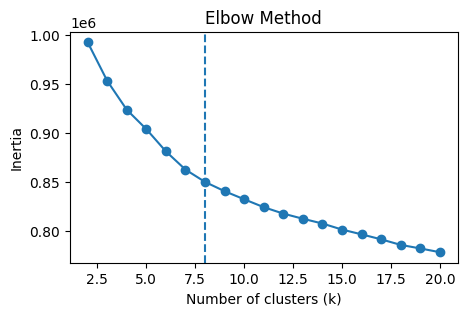

In [12]:
optimal_k, ks, inertias = find_optimal_k_elbow(all_embeddings)
plot_elbow(ks, inertias, optimal_k)

In [13]:
for k in [2,3,5,6,7,8]:
    kmeans = KMeans(n_clusters=k, random_state=42)
    expanded_gdf[f'scene_cluster_{k}'] = kmeans.fit_predict(all_embeddings)

### Check images to see whether clustering is logical (to me)

In [25]:
column ="scene_cluster_8"

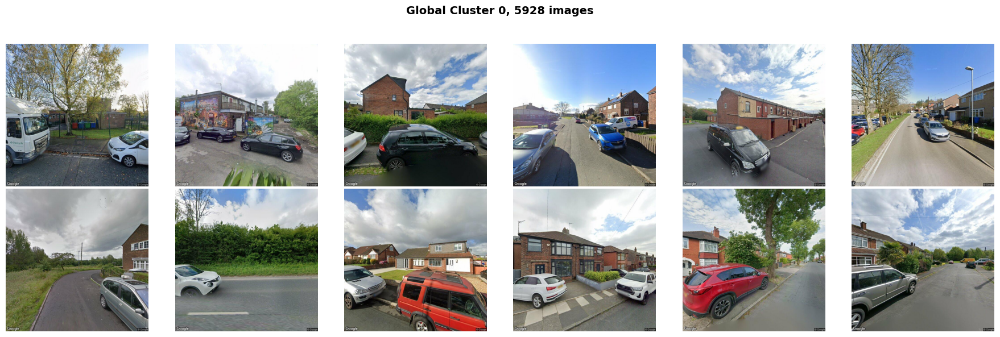

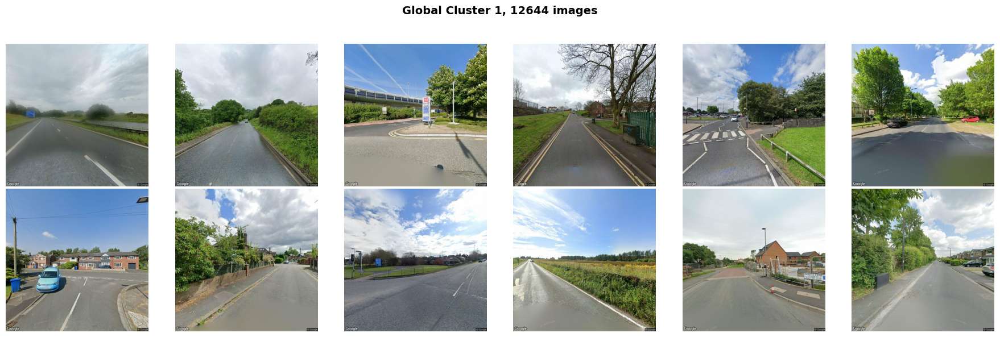

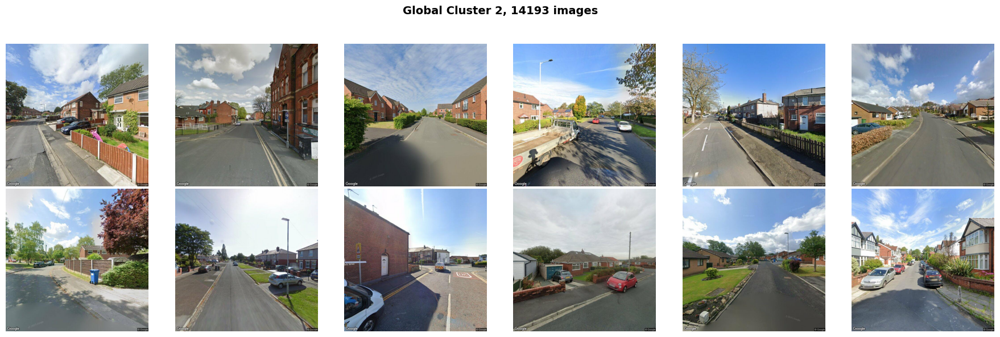

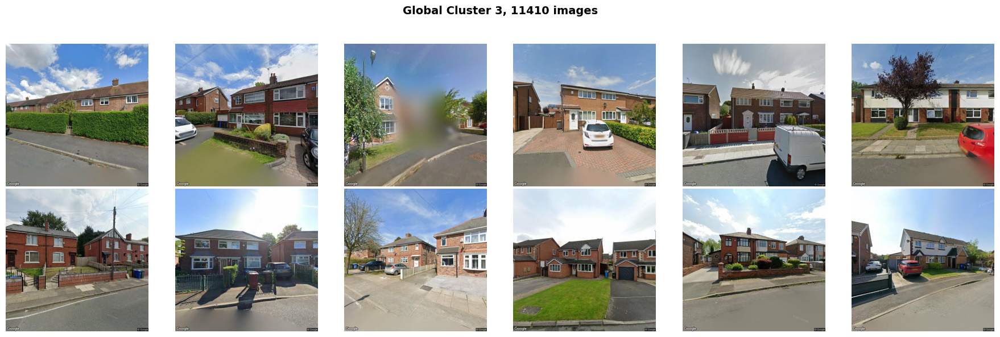

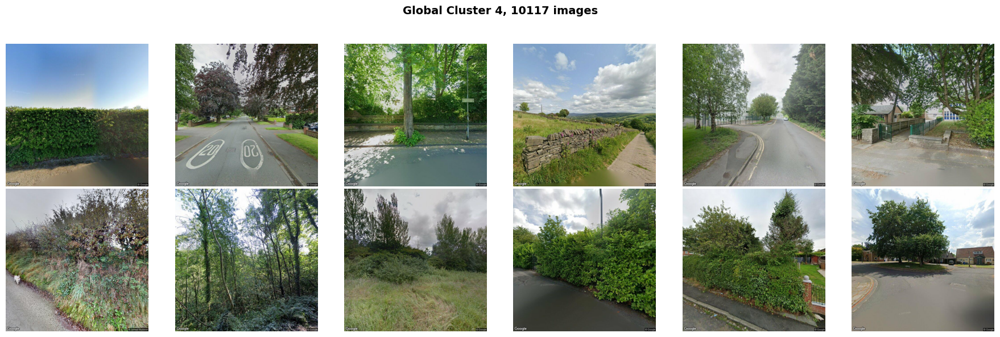

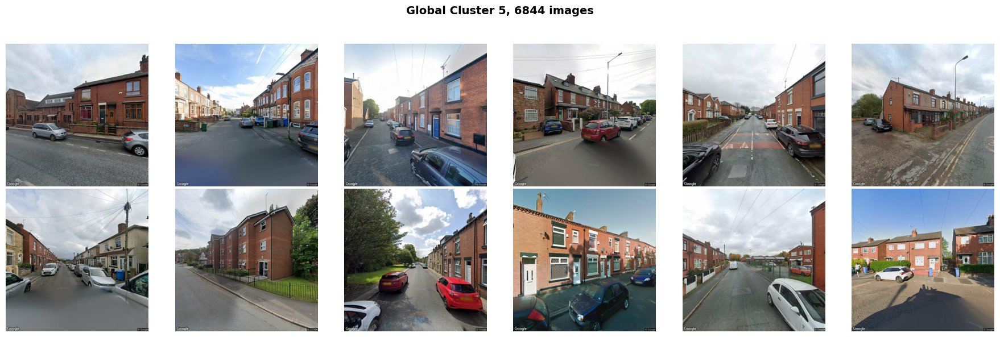

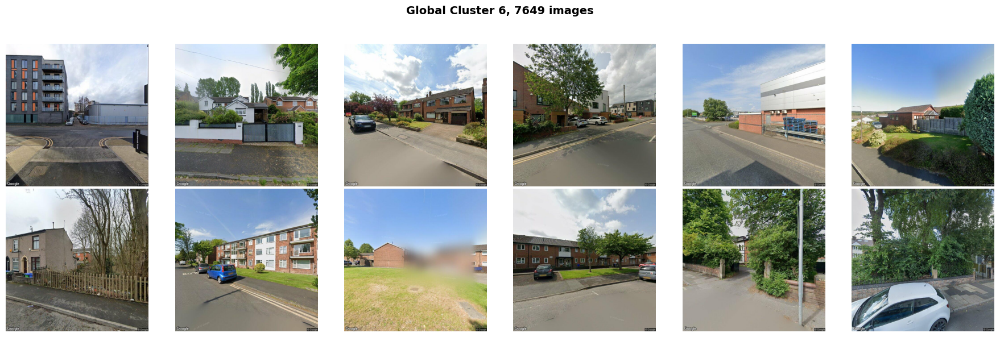

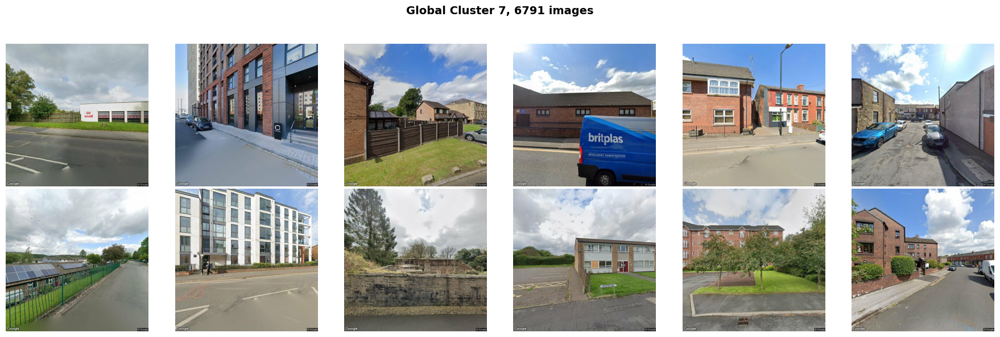

In [26]:
plot_example_images_per_cluster(expanded_gdf, k, column, n_show=12)

### Check whether there are different IMD distributions in different clusters

In [29]:
expanded_gdf = pd.merge(left=expanded_gdf, right=imd[['LSOA21CD', 'imd_rank']], on="LSOA21CD")

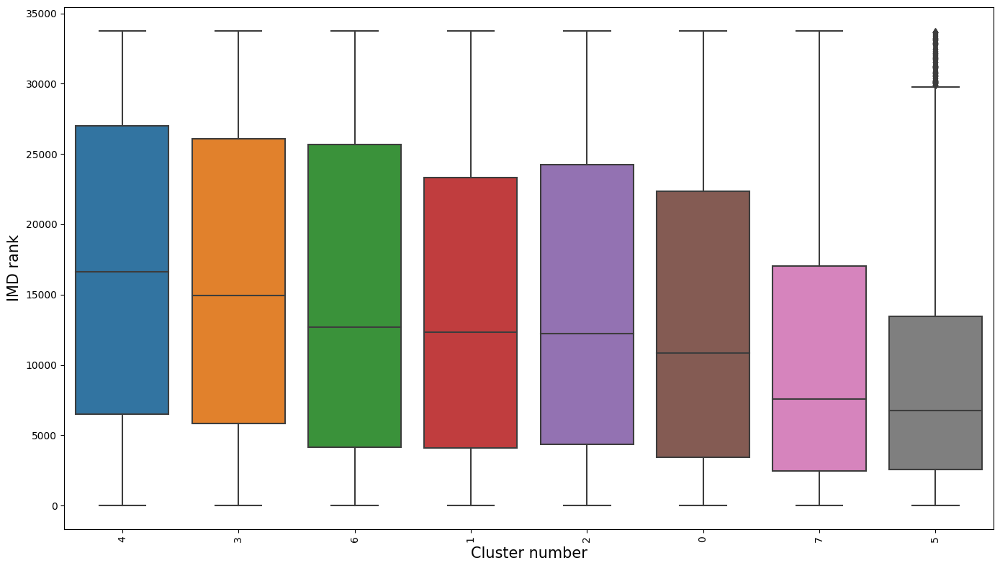

In [30]:
cluster_medians = (
    expanded_gdf.groupby(column)['imd_rank']
    .median()
    .sort_values(ascending=False))

# Extract the ordered cluster labels
ordered_clusters = cluster_medians.index.tolist()

plt.figure(figsize=(14, 8))
sns.boxplot(
    x=column,
    y='imd_rank',
    data=expanded_gdf,
    order=ordered_clusters)
plt.xticks(rotation=90)
plt.ylabel('IMD rank', fontsize=15)
plt.xlabel('Cluster number', fontsize=15)
plt.tight_layout()
plt.show()


### Check correlation of % images n each cluster and IMD rank

In [31]:
# Count rows per LSOA and cluster
counts = (
    expanded_gdf
    .groupby(["LSOA21CD", column])
    .size()
    .reset_index(name="count"))

# Pivot wider so clusters become columns
pivot = counts.pivot(index="LSOA21CD", columns=column, values="count").fillna(0)

# Convert counts to percentages (row-wise)
percentages = pivot.div(pivot.sum(axis=1), axis=0) * 100
# Optionally rename columns for clarity
percentages.columns = [f"cluster_{int(c)}_pct" for c in percentages.columns]
percentages = percentages.reset_index()
percentages = pd.merge(left=percentages, right=imd[['LSOA21CD', 'imd_rank']], on="LSOA21CD")

In [32]:
corrs = percentages.corr()['imd_rank']        # keep signs
corrs = corrs.drop('imd_rank')                # remove self-correlation
corrs.sort_values(key=np.abs, ascending=False)

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.


cluster_5_pct   -0.361237
cluster_3_pct    0.286696
cluster_4_pct    0.263057
cluster_7_pct   -0.174738
cluster_6_pct    0.103358
cluster_0_pct   -0.072723
cluster_2_pct    0.051740
cluster_1_pct   -0.023933
Name: imd_rank, dtype: float64

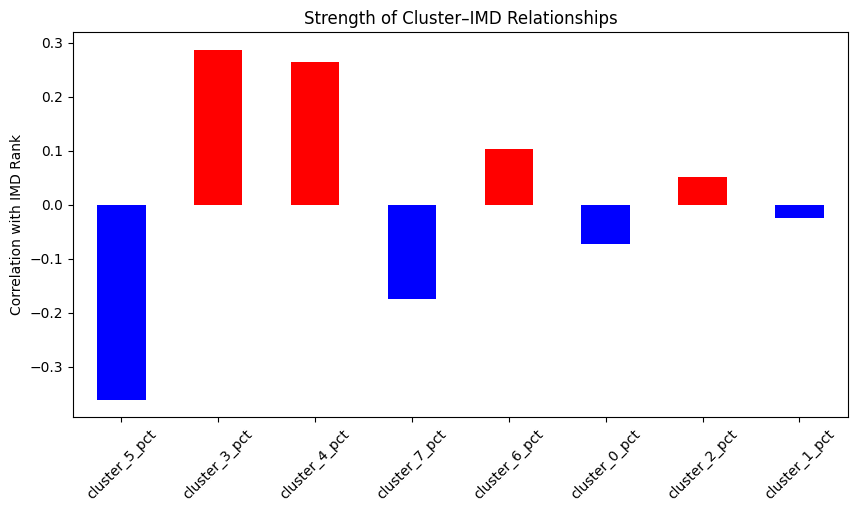

In [33]:
sorted_corr = corrs.sort_values(key=np.abs, ascending=False)

plt.figure(figsize=(10,5))
sorted_corr.plot(kind='bar', color=['red' if v>0 else 'blue' for v in sorted_corr])
plt.ylabel("Correlation with IMD Rank")
plt.title("Strength of Cluster–IMD Relationships")
plt.xticks(rotation=45)
plt.show()


In [34]:
cluster_cols = [c for c in percentages.columns if c.startswith("cluster")]

percentages['dominant_cluster'] = percentages[cluster_cols].idxmax(axis=1)

map_gdf = gm_lsoa.merge(
    percentages[['LSOA21CD','dominant_cluster']])

<Figure size 500x500 with 0 Axes>

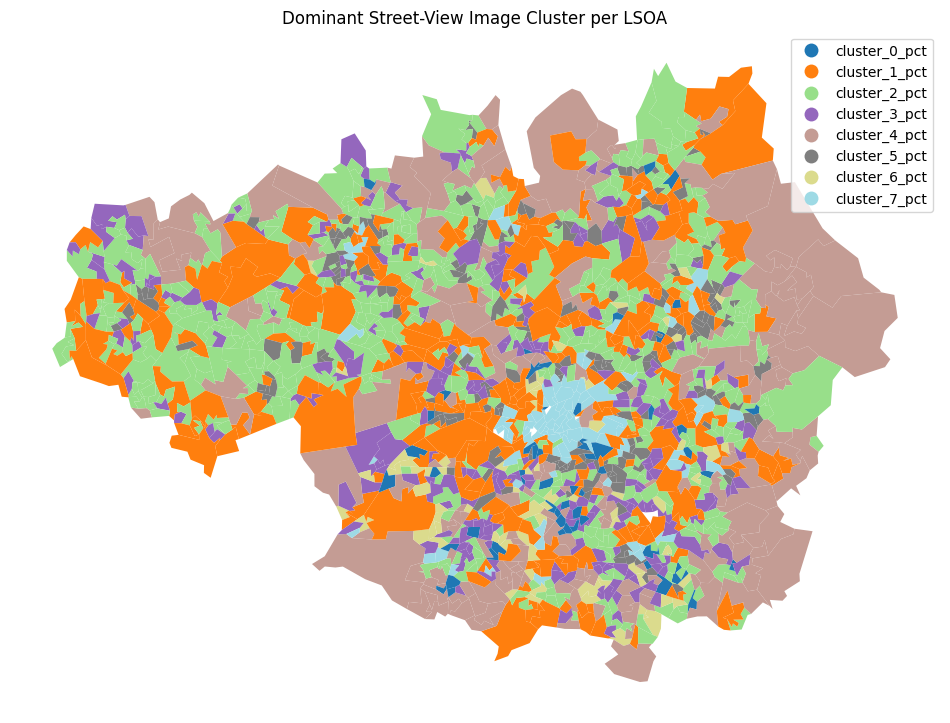

In [35]:
plt.figure(figsize=(5,5))
map_gdf.plot(column='dominant_cluster', categorical=True, figsize=(12,12),
             legend=True, cmap='tab20')
plt.title("Dominant Street-View Image Cluster per LSOA")
plt.axis('off')
plt.show()

In [23]:
# fig,axs=plt.subplots(ncols=4, nrows=2, figsize=(8,4), sharey=True, sharex=True)
# axs=axs.flatten()
# for i in range(0,8):

#     lsoas_with_clusters = gm_lsoa.merge(percentages, on="LSOA21CD", how="left")

#     # Fill any missing percentage values with 0 (e.g., if some LSOAs had no rows in expanded_gdf)
#     lsoas_with_clusters = lsoas_with_clusters.fillna(0)

#     lsoas_with_clusters.plot(f'cluster_{i}_pct', ax=axs[i])
#     axs[i].set_title(f"Cluster {i}")
#     axs[i].axis("off")
    
# fig,axs=plt.subplots(ncols=4, nrows=2, figsize=(8,4), sharey=True, sharex=True)
# axs=axs.flatten()
# for i in range(0,8):

#     lsoas_with_clusters = central_lsoas.merge(percentages, on="LSOA21CD", how="left")

#     # Fill any missing percentage values with 0 (e.g., if some LSOAs had no rows in expanded_gdf)
#     lsoas_with_clusters = lsoas_with_clusters.fillna(0)

#     lsoas_with_clusters.plot(f'cluster_{i}_pct', ax=axs[i])
#     axs[i].set_title(f"Cluster {i}")    
#     axs[i].axis("off")

### For each LSOA, compare between and within cluster group similarity

In [24]:
lsoa_sim_df = lsoa_within_between_summary(expanded_gdf)
lsoa_sim_df.head()

KeyError: 'LSOA11CD'

### For each LSOA, calculate mean embedding in each cluster

In [ ]:
K = expanded_gdf['scene_cluster'].max() + 1  # number of clusters
lsoa_cluster_means_df = mean_embedding_per_cluster(expanded_gdf, K, 'embedding_reduced')
lsoa_cluster_weighted_means_df = weighted_mean_embedding_per_cluster(expanded_gdf, 5, 'embedding')

In [ ]:
lsoa_cluster_weighted_means_df = cluster_embeddings_with_proportions(expanded_gdf, 5, 'embedding')
embedding_dim = 768
X_ml = flatten_weighted_cluster_features(lsoa_cluster_weighted_means_df, K=5, embedding_dim=embedding_dim)

In [ ]:
# Assume df_lsoa_features is output of cluster_embeddings_with_proportions
embedding_dim = 768
X_ml = flatten_weighted_cluster_features(lsoa_cluster_weighted_means_df, K=5, embedding_dim=embedding_dim)

In [ ]:
X_ml.to_pickle(data_dir + "xml.pkl")

In [ ]:
lsoa_cluster_means_df.to_pickle(data_dir + "global_clusters_mean_embeddings.pkl")
lsoa_cluster_weighted_means_df.to_pickle(data_dir + "global_clusters_weighted_mean_embeddings.pkl")

### Keep only LSOAs where no cluster embedding is missing

In [ ]:
# cluster_cols = [f'cluster_{k}' for k in range(K)]
# complete_lsoas_df = lsoa_cluster_means_df.dropna(subset=cluster_cols)

# print(f"Kept {len(complete_lsoas_df)} LSOAs out of {len(lsoa_cluster_means_df)} that have all clusters present")

In [ ]:
lsoa_cluster_means_df.to_pickle(data_dir + "global_clusters_mean_embeddings.pkl")

# Train on all other clusters, test on this cluster

In [ ]:
# --- Extract data ---
X = np.vstack(expanded_gdf["embeddings"].values)
y = expanded_gdf["imd_rank"].values

# Get list of clusters
clusters = expanded_gdf["scene_cluster_8"].values
unique_clusters = np.unique(clusters)

# List to store results
results_global_to_cluster = []

# For each cluster
for c in unique_clusters:
    print(f"\nEvaluating cluster {c}...")

    # Train on all images NOT in cluster c
    train_mask = clusters != c
    test_mask = clusters == c

    X_train, y_train = X[train_mask], y[train_mask]
    X_test, y_test = X[test_mask], y[test_mask]

    # Fit a simple model (can swap for MLP or RandomForest)
    model = XGBRegressor(objective='reg:squarederror',  # standard regression objective
        random_state=42,
        n_jobs=-1,
        verbosity=0)
    model.fit(X_train, y_train)

    # Predict on cluster C
    y_pred = model.predict(X_test)

    # Evaluate
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))


    results_global_to_cluster.append({"cluster": c,
                                      "r2": r2,
                                      "rmse": rmse,
                                      "n_test": len(y_test)})

results_global_to_cluster = pd.DataFrame(results_global_to_cluster)
print(results_global_to_cluster)


In [ ]:
results_global_to_cluster

In [ ]:
# Full data
X_full = np.vstack(expanded_gdf["embeddings"].values)
y_full = expanded_gdf["imd_rank"].values

# Train/test split (optional, or use all data for simplicity)
X_train, X_test, y_train, y_test = train_test_split(
    X_full, y_full, test_size=0.2, random_state=42)

# Fit model
model = XGBRegressor(objective='reg:squarederror',  # standard regression objective
        random_state=42,
        n_jobs=-1,
        verbosity=0)
model_full.fit(X_train, y_train)

# Predict
y_pred_full = model_full.predict(X_test)

# Evaluate
r2_full = r2_score(y_test, y_pred_full)
rmse_full = np.sqrt(mean_squared_error(y_test, y_pred_full))

print(f"Full dataset model R²: {r2_full:.3f}, RMSE: {rmse_full:.1f}")
